In [4]:
from datetime import datetime as dt
from datetime import timedelta

# 日付条件の設定
strdt = dt.strptime("20180101", '%Y%m%d')  # 開始日
enddt = dt.strptime("20191231", '%Y%m%d')  # 終了日

days_num = (enddt - strdt).days + 1

https://qiita.com/YuukiMiyoshi/items/42a890a95af6ab7a5348

In [5]:
days_num

730

In [53]:
datelist = []
for i in range(days_num):
    datelist.append(strdt + timedelta(days=i))

In [7]:
address=[]
for d in datelist:
    url="https://www.reuters.com/resources/archive/jp/"+ d.strftime("%Y%m%d")+".html"
    address.append(url)

In [8]:
import requests
from bs4 import BeautifulSoup
import re

In [15]:
p = re.compile(r"<[^>]*?>")

In [10]:
url = address[0]
html = requests.get(url)
html.encoding = 'shift-jis'
soup = BeautifulSoup(html.text, 'html.parser')
url2=soup.find_all("body")
url3=url2[0].find_all("div",{"class":"headlineMed"})
result = []
for word in url3:
    string=p.sub("",str(word))
    result.append(string)

In [8]:
import pickle
def makefile(what,filename):
    with open(filename,"wb") as f3:
        pickle.dump(what,f3)
def readfile(filename):
    with open(filename,"rb") as f4:
        ans=pickle.load(f4)
    return ans

In [9]:
texts=dict()
n=0
for url in address:
    if url[-13:-5] in texts:
        pass
    else:
        try:
            html = requests.get(url)
            html.encoding = 'utf-8'
            soup = BeautifulSoup(html.text, 'html.parser')
            url2=soup.find_all("body")
            url3=url2[0].find_all("div",{"class":"headlineMed"})
            result = []
            for word in url3:
                string=p.sub("",str(word))
                result.append(string)
            texts[url[-13:-5]]=result
        except:
            texts[url[-13:-5]]=[]
        n+=1
        if n%100==0:
            print(n)
makefile(texts,"news2018-2019jis.pkl")

100
200
300
400
500
600
700


In [9]:
texts=readfile("news2018-2019jis.pkl")

In [10]:
texts

{'20180101': ['イランデモ、死者計１３人に\xa011:38午後 UTC',
  'Ａ東京、琉球が勝つ\xa011:14午後 UTC',
  '香港民主派が元日デモ\xa09:22午後 UTC',
  '写真が語る2017年：物議を呼んだ米大統領就任式の全景写真\xa06:56午後 UTC',
  '写真が語る2017年：ロヒンギャ難民女性、決死の脱出\xa06:55午後 UTC',
  '写真が語る2017年：草刈る少年、米大統領に気付かず\xa06:54午後 UTC',
  'Ｃ大阪、４３大会ぶり優勝\xa06:29午後 UTC',
  'ＮＨＬ、ゴールデンナイツが首位\xa06:13午後 UTC',
  'ＤｅＮＡラミレス監督、優勝意欲\xa06:02午後 UTC',
  'ボクシング、統一王者田口が会見\xa05:57午後 UTC',
  '仰星、東福岡などが８強\xa05:46午後 UTC',
  'Ｃ大阪が４度目の優勝\xa05:43午後 UTC',
  '天皇杯サッカー\u3000決勝\u3000\u3000結果\u3000\xa05:25午後 UTC',
  '実業団駅伝、旭化成が２連覇\xa04:56午後 UTC',
  'ＮＢＡ、ウォリアーズが首位独走\xa04:05午後 UTC',
  'ＮＦＬ、ビルズ１８季ぶりＰＯへ\xa04:01午後 UTC',
  '皇居で新年祝賀の儀\xa03:38午後 UTC',
  '焦点：軍の「外交発言力」高まるロシア、プーチン氏が後押し\xa02:44午後 UTC',
  '初日の出を背に聖火リレー、韓国\xa02:44午後 UTC',
  'マンＣの連勝１８で止まる\xa01:57午後 UTC',
  '個人投資家株ファイター：株ファイター注目の2018年アツイ成長期待株！！【FISCOソーシャルレポーター】\xa012:00午後 UTC',
  '新聞２社と大会スポンサー契約\xa010:34午前 UTC',
  '年賀状、一斉に新春の街へ\xa010:23午前 UTC',
  'ビット田代の2018年仮想通貨びっくり10大ニュース Part 2【フィスコ・ビットコインニュース】\xa09:41午前 UTC',
  'ビット田代の2018年仮想通貨びっくり10大ニュース Part 1【フィスコ

In [10]:
import pandas as pd
NEWS = pd.DataFrame(list(texts.items()),columns=['date', 'NEWs'])

In [11]:
news = pd.DataFrame(index=[],columns=['date', 'NEWS'])

for i in range(0,len(NEWS['NEWs'])):
    for l in range(0,len(NEWS['NEWs'][i])):
        tmp_se = pd.Series( [NEWS['date'][i], NEWS['NEWs'][i][l]], index=news.columns )
        news = news.append( tmp_se, ignore_index=True )

In [12]:
news.set_index('date')
dateTimeIndex = pd.DatetimeIndex(news['date'])
news.index = dateTimeIndex
news = news.drop("date", axis=1)

In [13]:
news.to_csv('NEWS-split2018-2019.csv')

In [10]:
from wordcloud import WordCloud

In [11]:
sentence=[]
for date in texts:
    daynews=texts[date]
    for title in daynews:
        sentence.append(title)

In [12]:
import os

In [13]:
import MeCab

In [14]:
wakati = MeCab.Tagger('-Owakati')

In [15]:
time=[]
for n in range(len(sentence)):
    word = str(sentence[n]).split('\xa0')
    sentence[n]=word[0]
    time.append(word[1])

In [16]:
aftermecab=[]
for n in range(len(sentence)):
    word = sentence[n]
    aftermecab.append(wakati.parse(word).strip())

In [17]:
long_string = ' '.join(aftermecab)

In [18]:
wordcloud = WordCloud(background_color="white", max_words=5000, contour_width=3, contour_color='steelblue',font_path="IPAexfont00401/ipaexg.ttf")

In [19]:
wordcloud.generate(long_string)

https://yukituna.com/2263/

https://towardsdatascience.com/end-to-end-topic-modeling-in-python-latent-dirichlet-allocation-lda-35ce4ed6b3e0

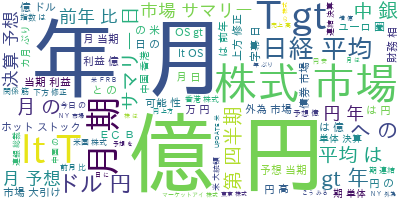

In [20]:
wordcloud.to_image()

In [21]:
from sklearn.feature_extraction.text import CountVectorizer
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [22]:
sns.set_style('whitegrid')
%matplotlib inline

In [23]:
# Helper function
def plot_10_most_common_words(count_data, count_vectorizer):
    import matplotlib.pyplot as plt
    words = count_vectorizer.get_feature_names()
    total_counts = np.zeros(len(words))
    for t in count_data:
        total_counts+=t.toarray()[0]
    
    count_dict = (zip(words, total_counts))
    count_dict = sorted(count_dict, key=lambda x:x[1], reverse=True)[0:10]
    words = [w[0] for w in count_dict]
    counts = [w[1] for w in count_dict]
    x_pos = np.arange(len(words)) 
    
    plt.figure(2, figsize=(15, 15/1.6180))
    plt.subplot(title='10 most common words')
    sns.set_context("notebook", font_scale=1.25, rc={"lines.linewidth": 2.5})
    sns.barplot(x_pos, counts, palette='husl')
    plt.xticks(x_pos, words, rotation=90,fontname="MS Gothic") 
    plt.xlabel('words',)
    plt.ylabel('counts')
    plt.show()


In [24]:
# Initialise the count vectorizer with the English stop words
count_vectorizer = CountVectorizer(stop_words='english')
# Fit and transform the processed titles
count_data = count_vectorizer.fit_transform(aftermecab)
# Visualise the 10 most common words


C:\home\anaconda\envs\Tensorflow\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


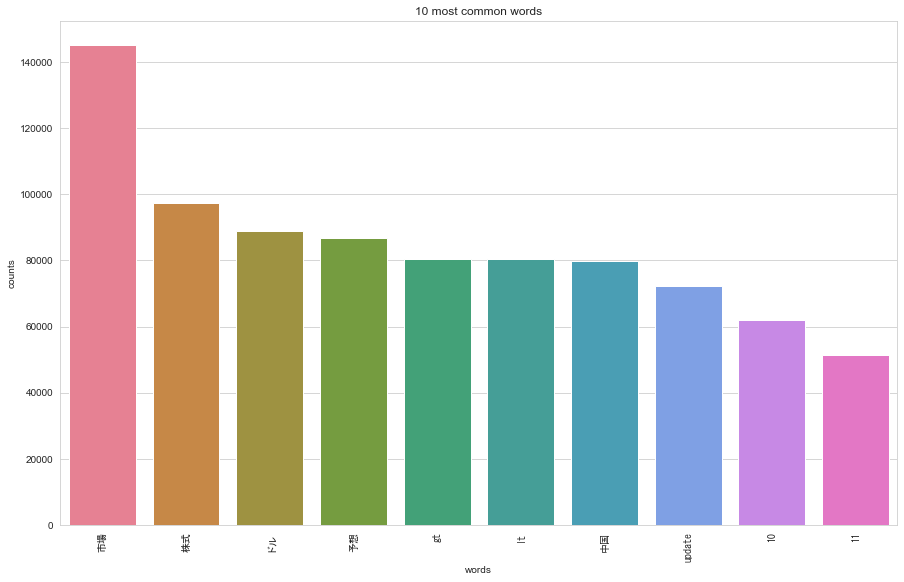

In [25]:
plot_10_most_common_words(count_data, count_vectorizer)

In [26]:
import warnings
warnings.simplefilter("ignore", DeprecationWarning)
# Load the LDA model from sk-learn
from sklearn.decomposition import LatentDirichletAllocation as LDA
 
# Helper function
def print_topics(model, count_vectorizer, n_top_words):
    words = count_vectorizer.get_feature_names()
    for topic_idx, topic in enumerate(model.components_):
        print("\nTopic #%d:" % topic_idx)
        print(" ".join([words[i] for i in topic.argsort()[:-n_top_words - 1:-1]]))


In [27]:
# Tweak the two parameters below
number_topics = 5
number_words = 10
# Create and fit the LDA model
lda = LDA(n_components=number_topics, n_jobs=-1)
lda.fit(count_data)
# Print the topics found by the LDA model
print("Topics found via LDA:")
print_topics(lda, count_vectorizer, number_words)

Topics found via LDA:

Topic #0:
予想 lt gt 11 当期 10 修正 利益 連結 決算

Topic #1:
gt lt ストック ホット など 買い 販売 事業 update 買収

Topic #2:
株式 市場 平均 日経 中国 マーケットアイ 金利 香港 反発 続伸

Topic #3:
中国 総裁 大統領 update ない 首相 経済 日銀 政府 金融

Topic #4:
市場 ドル 外為 株式 上昇 サマリー ｎｙ 東京 ユーロ 欧州


In [28]:
import torch
from transformers import BertJapaneseTokenizer, BertForMaskedLM

In [31]:
tokenizer = BertJapaneseTokenizer.from_pretrained('cl-tohoku/bert-base-japanese-whole-word-masking')

In [37]:
sentence[0]

'ＮＢＡ＝スパーズがヒートに快勝'

In [38]:
text = sentence[0]
tokenized_text = tokenizer.tokenize(text)

In [47]:
tokenized_text

['[MASK]', '=', '[MASK]', '##ーズ', 'が', 'ヒート', 'に', '快勝']

In [46]:
masked_index = 0
tokenized_text[masked_index] = '[MASK]'

In [40]:
indexed_tokens = tokenizer.convert_tokens_to_ids(tokenized_text)

In [41]:
tokens_tensor = torch.tensor([indexed_tokens])

In [42]:
model = BertForMaskedLM.from_pretrained('cl-tohoku/bert-base-japanese-whole-word-masking')
model.eval()

Some weights of the model checkpoint at cl-tohoku/bert-base-japanese-whole-word-masking were not used when initializing BertForMaskedLM: ['cls.seq_relationship.weight', 'cls.seq_relationship.bias']
- This IS expected if you are initializing BertForMaskedLM from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertForMaskedLM from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


BertForMaskedLM(
  (bert): BertModel(
    (embeddings): BertEmbeddings(
      (word_embeddings): Embedding(32000, 768, padding_idx=0)
      (position_embeddings): Embedding(512, 768)
      (token_type_embeddings): Embedding(2, 768)
      (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (encoder): BertEncoder(
      (layer): ModuleList(
        (0): BertLayer(
          (attention): BertAttention(
            (self): BertSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.1, inplace=False)
            )
            (output): BertSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=Tr

In [43]:
with torch.no_grad():
    outputs = model(tokens_tensor)
    predictions = outputs[0][0, masked_index].topk(5) # 予測結果の上位5件を抽出

In [44]:
for i, index_t in enumerate(predictions.indices):
    index = index_t.item()
    token = tokenizer.convert_ids_to_tokens([index])[0]
    print(i, token)

0 オイラ
1 テキ
2 スパ
3 オニ
4 フィリ


In [12]:
address=[]
for d in datelist:
    url="https://www.reuters.com/resources/archive/jp/20180101.html"
    address.append(url)

In [13]:
url = address[0]
html = requests.get(url)
html.encoding = 'shift-jis'
soup = BeautifulSoup(html.text, 'html.parser')
url2=soup.find_all("body")
url3=url2[0].find_all("div",{"class":"headlineMed"})

In [23]:
#url4=soup.find_all("li class=nav-item")
link=soup.find(class_="a")
url

'https://www.reuters.com/resources/archive/jp/20180101.html'

In [24]:
print(link.get('href'))

AttributeError: 'NoneType' object has no attribute 'get'

In [16]:
url2

[<body class="BETAJP">
 <!-- New Google Tag Manager (noscript) -->
 <noscript><iframe height="0" src="//www.googletagmanager.com/ns.html?id=GTM-W9SLGS" style="display:none;visibility:hidden" width="0"></iframe></noscript>
 <!-- End Google Tag Manager (noscript) -->
 <section class="hidden" id="breakingNewsContainer"><div class="group wrap" id="breakingNews"><div class="breaking-content"><div class="breaking-news-type"></div><div class="breaking-news-content"></div></div><div class="close-btn">X</div></div></section>
 <header id="headerMain">
 <div class="container group">
 <div class="edition-container group">
 <div class="edition-label">繧ｨ繝�繧｣繧ｷ繝ｧ繝ｳ:</div>
 <div class="edition-selector">
 <div class="edition">譌･譛ｬ</div>
 <div class="edition-arrow"></div>
 </div>
 </div>
 <div class="reuters-nav-main">
 <h2 class="reuters-logo">
 <a href="/" title="Reuters"></a>
 </h2>
 </div>
 <div class="utilities" id="utilities"></div>
 </div>
 </header>
 <nav id="headerNav">
 <div class="container 

In [25]:
html = requests.get(url)
html.encoding = 'utf-8'
soup = BeautifulSoup(html.text, 'html.parser')
url2=soup.find_all("body")
url3=url2[0].find_all("div",{"class":"headlineMed"})

In [44]:
link = url3[0].find("a")

In [47]:
len(url3)

37

In [46]:
link.get('href')

'http://JP.reuters.com/article/idJP2018010101000898'

In [51]:
URL= []
for i in range(0,len(url3)):
    html = requests.get(url)
    html.encoding = 'utf-8'
    soup = BeautifulSoup(html.text, 'html.parser')
    url2=soup.find_all("body")
    url3=url2[0].find_all("div",{"class":"headlineMed"})
    link = url3[i].find("a")
    URL.append(link.get('href'))

In [52]:
URL

['http://JP.reuters.com/article/idJP2018010101000898',
 'http://JP.reuters.com/article/idJP2018010101001257',
 'http://JP.reuters.com/article/idJP2018010101001217',
 'http://JP.reuters.com/article/usa-potus-idJPKBN1EG0XG',
 'http://JP.reuters.com/article/global-poy-stories-16-idJPKBN1EM0G0',
 'http://JP.reuters.com/article/global-usa-potus-idJPKBN1EG0Y4',
 'http://JP.reuters.com/article/idJP2018010101001172',
 'http://JP.reuters.com/article/idJP2018010101001087',
 'http://JP.reuters.com/article/idJP2018010101001174',
 'http://JP.reuters.com/article/idJP2018010101001160',
 'http://JP.reuters.com/article/idJP2018010101001132',
 'http://JP.reuters.com/article/idJP2018010101001154',
 'http://JP.reuters.com/article/idJP2018010102000021',
 'http://JP.reuters.com/article/idJP2018010101001063',
 'http://JP.reuters.com/article/idJP2018010101001052',
 'http://JP.reuters.com/article/idJP2018010101001081',
 'http://JP.reuters.com/article/idJP2018010101001001',
 'http://JP.reuters.com/article/russi